In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import altair as alt
import plotly.express as px

import matplotlib.pyplot as plt
import matplotlib.cm as cm
colors=plt.rcParams['axes.prop_cycle'].by_key()['color']

from vega_datasets import data

# the following line allows altair to plot datasets with more than 5000 rows
# for details on this see https://altair-viz.github.io/user_guide/large_datasets.html
alt.data_transformers.enable("vegafusion")

DataTransformerRegistry.enable('vegafusion')

# Histograms and densities

## Introduction: an example dataset

In [2]:
# diamonds dataset of ggplot2
# see https://ggplot2.tidyverse.org/reference/diamonds.html for source and documentation

# columns
# price: price in US dollars ($326--$18,823)
# carat: weight of the diamond (0.2--5.01)
# cut: quality of the cut (Fair, Good, Very Good, Premium, Ideal)
# color: diamond colour, from D (best) to J (worst)
# clarity: a measurement of how clear the diamond is (I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best))
# x: length in mm (0--10.74)
# y: width in mm (0--58.9)
# z: depth in mm (0--31.8)
# depth: total depth percentage = z / mean(x, y) = 2 * z / (x + y) (43--79)
# table: width of top of diamond relative to widest point (43--95)

data_diamonds=pd.read_csv("data/diamonds.csv")

In [3]:
data_diamonds

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


In [4]:
# reduce nr of colums, since its pretty heavy for plotting in full
sel=np.random.choice(np.arange(len(data_diamonds)),size=5000,replace=False)

data_diamonds_sel=data_diamonds.loc[sel]

In [5]:
#chart=alt.Chart(data_diamonds).mark_point().encode(x="carat",y="price",color="color")
chart=alt.Chart(data_diamonds_sel).mark_point().encode(x="carat",y="price",color="cut")
chart

alt.Chart(...)

In [6]:
# a small aside: sorting of categorical data
# observe: odering of cuts in legend is alphabetical, not corresponding to quality of cuts
# fix this now (and also for other categorical types)

In [7]:
from pandas.api.types import CategoricalDtype

dtype_cut = CategoricalDtype(categories=["Fair","Good","Very Good","Premium","Ideal"], ordered=True)
data_diamonds["cut"]=data_diamonds["cut"].astype(dtype_cut)

dtype_color = CategoricalDtype(categories=["D","E","F","G","H","I","J"], ordered=True)
data_diamonds["color"]=data_diamonds["color"].astype(dtype_color)

dtype_clarity = CategoricalDtype(categories=["I1","SI2","SI1","VS2","VS1","VVS2","VVS1","IF"], ordered=True)
data_diamonds["clarity"]=data_diamonds["clarity"].astype(dtype_clarity)

data_diamonds_sel=data_diamonds.loc[sel]

In [8]:
data_diamonds["cut"].dtype

CategoricalDtype(categories=['Fair', 'Good', 'Very Good', 'Premium', 'Ideal'], ordered=True, categories_dtype=object)

In [9]:
# try to encode as color: color, cut, clarity
chart=alt.Chart(data_diamonds_sel).mark_point().encode(x="carat",y="price",color=alt.Color("cut").scale(scheme="magma"))
chart

alt.Chart(...)

In [10]:
# but here want to go beyond scatter plot
# we want to get a high-level impression of the distribution of all ~50k diamonds
# how common are different weights? prices? joint distribution?

## Basic histograms

In [11]:
# to get overview on distribution of values/points, divide real line into bins
# count number of data points in each bin
# conventionally display these numbers as a bar-like chart

### Directly plot histograms from data

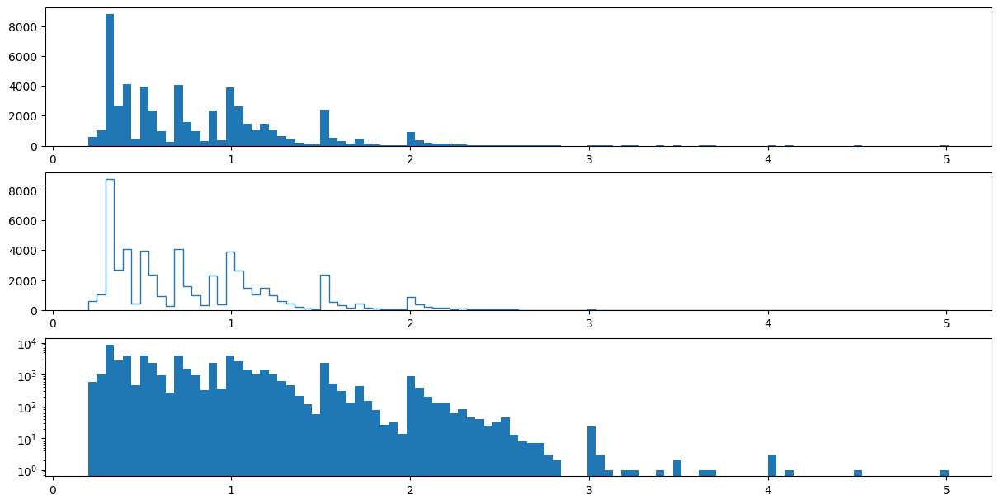

In [15]:
fig,ax=plt.subplots(3,1,figsize=(12,6),layout="constrained")
ax[0].hist(data_diamonds["carat"],bins=100)
ax[1].hist(data_diamonds["carat"],bins=100,histtype="step")
ax[2].hist(data_diamonds["carat"],bins=100,log=True)
plt.show()

In [28]:
chart1=alt.Chart(data_diamonds).mark_bar().encode(
        alt.X("carat", bin=True),
        y="count()"
        )
chart2=alt.Chart(data_diamonds).mark_bar().encode(
        alt.X("carat").bin(extent=[0,6],step=6/20),
        alt.Y("count()").scale(type="log")
        )

chart1 | chart2
# note: here we do not use a distinct histogram plot, but a basic bar chart, and supply it with transformed data
# via some specialized syntax

alt.HConcatChart(...)

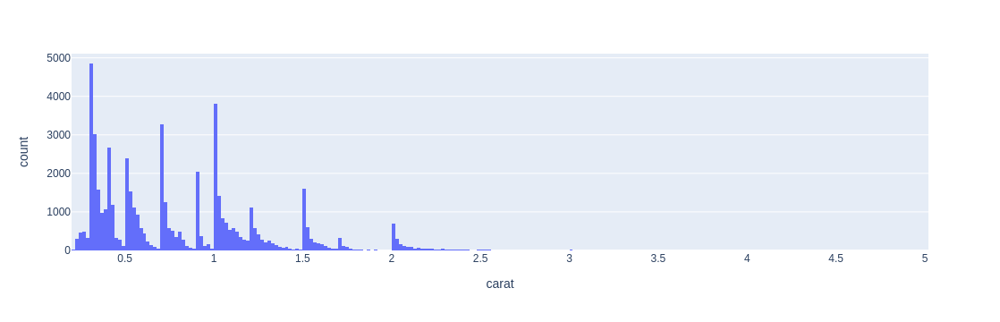

In [15]:
figpl = px.histogram(data_diamonds, x="carat")
figpl.show()

In [16]:
# note: we did not specify the bins, each library chose bins automatically, and made a different choice
# there is no universal "one size fits all"-rule for automatically choosing the bins
# some discussion of the bin width is given further below

### Directly computing the histograms

In [16]:
# the above is nice for a very fast visualization
# sometimes we want to perform further processing of the histogram data
# so of course there are also ways to compute a histogram without plotting it directly

In [17]:
counts,binlims=np.histogram(data_diamonds["carat"])
counts,binlims

(array([25155, 18626,  7129,  2349,   614,    53,     6,     5,     2,
            1]),
 array([0.2  , 0.681, 1.162, 1.643, 2.124, 2.605, 3.086, 3.567, 4.048,
        4.529, 5.01 ]))

In [31]:
print("len of counts: ",len(counts))
print("len of binlims: ",len(binlims))

len of counts:  10
len of binlims:  11


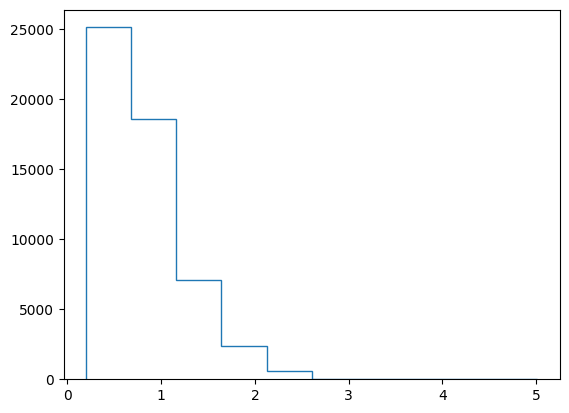

In [35]:
# the output of np.histogram can be turned into a plot by the matplotlib stairs function
plt.stairs(counts,binlims)
plt.show()

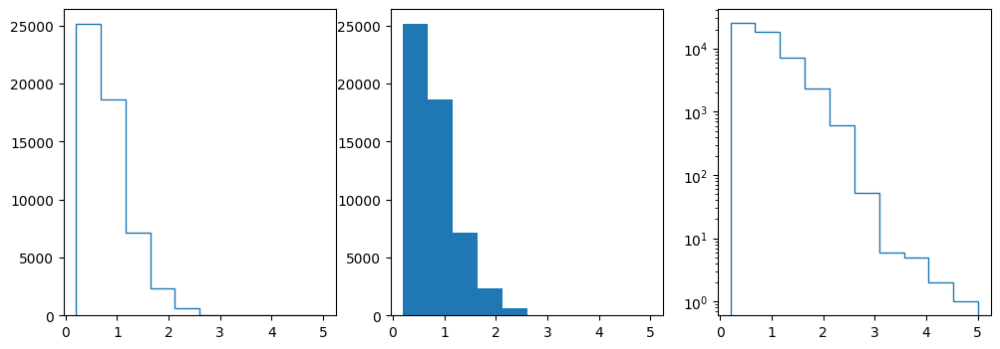

In [37]:
# as above, we can apply various plotting styles
fig,ax=plt.subplots(1,3,figsize=(12,4))
ax[0].stairs(counts,binlims)
ax[1].stairs(counts,binlims,fill=True)
ax[2].stairs(counts,binlims)
ax[2].set_yscale("log")
#ax[1].bar(binlims[:-1],counts,width=binlims[1:]-binlims[:-1],lw=1,fill=False)
#ax[2].bar(binlims[:-1],counts,width=binlims[1:]-binlims[:-1])
plt.show()

## Normalization and bin width

In [18]:
# above we have shown raw counts of the histograms: the number of data points in each bin
# relative numbers or transformed probability densities might be more appropiate when dealing
# with a very large number of samples and their underlying assumed ground truth distribution

In [20]:
# a simple mixture of Gaussian example

# number of sample points, number of bins
nXList=[1000,3000,10000]
nBinList=[10,30,100]
# relevant region
rng=[-5,5]

# specify a simple Gaussian mixture model:
# lists of: mean, standard deviation, relative weight
meanList=[-2,1]
stdList=[0.5,0.9]
weightList=[0.3,0.7]

# sample points from Gaussian mixture model
xList=[]
for nX in nXList:
    x=np.zeros((0,),dtype=np.double)
    for mean,std,weight in zip(meanList,stdList,weightList):
        x=np.concatenate((x,mean+std*np.random.normal(size=int(nX*weight))))
    xList.append(x)

# evaluate the true Gaussian density function for comparison
nPlot=1000
x_plot=np.linspace(rng[0],rng[1],num=nPlot)
real_dens=np.zeros_like(x_plot)
for mean,std,weight in zip(meanList,stdList,weightList):
    real_dens+=(1./np.sqrt(2*np.pi)/std)*np.exp(-0.5*(x_plot-mean)**2/std**2)*weight

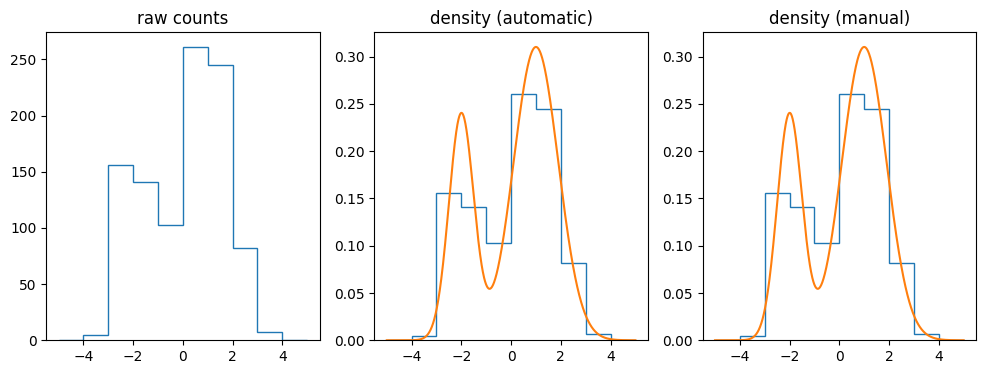

In [22]:
# in second call we specify to renormalize the histogram to a probability density
# it can then be compared directly to the underlying true density function
hist1=np.histogram(xList[0],bins=nBinList[0],range=rng)
hist2=np.histogram(xList[0],bins=nBinList[0],range=rng,density=True)
fig,ax=plt.subplots(1,3,figsize=(12,4))
ax[0].stairs(*hist1)
ax[1].stairs(*hist2)
ax[1].plot(x_plot,real_dens,color=colors[1])

# manual computation of the density from the raw counts
# first normalize total sum to one, then divide by width of each bin
counts,binlims=hist1
widths=binlims[1:]-binlims[:-1]
dens=counts/np.sum(counts)/widths
ax[2].stairs(dens,binlims)
ax[2].plot(x_plot,real_dens,color=colors[1])

ax[0].set_title("raw counts")
ax[1].set_title("density (automatic)")
ax[2].set_title("density (manual)")
plt.show()

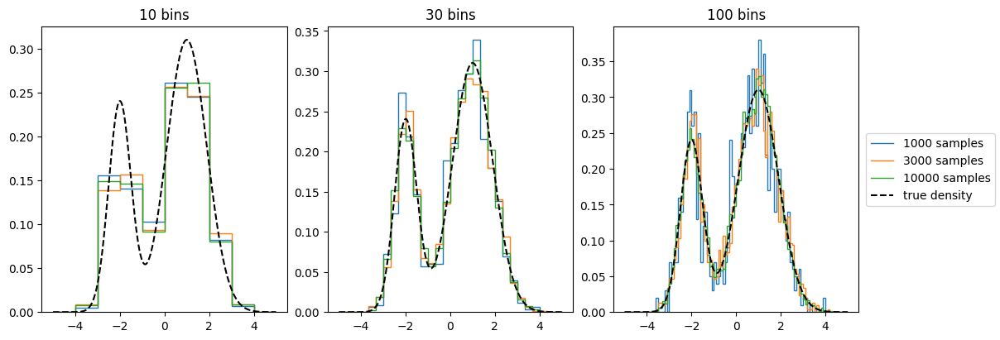

In [25]:
# the nice thing is that the density is approximately invariant wrt number of samples and width of bins
# of course this is only approximately true:
# with few samples per bin there will be high random fluctuation
# with few bins there will be strong discretization artefacts

# there are many ways to specify the bins for histograms
# both in plotting and in mere computation
# we refer to the respective documentation for details

fig,ax=plt.subplots(1,3,figsize=(12,4),layout="constrained")

for i in range(len(nBinList)):
    for j in range(len(nXList)):
        hist=np.histogram(xList[j],bins=nBinList[i],range=rng,density=True)
        
        if i==0:
            label=f"{nXList[j]} samples"
        else:
            label=""
        ax[i].stairs(*hist,color=colors[j],label=label)
        if i==0:
            label="true density"
        else:
            label=""
    ax[i].plot(x_plot,real_dens,c="k",ls="dashed",label=label)
    ax[i].set_title(f"{nBinList[i]} bins")
fig.legend(loc="outside center right")
plt.show()


## Kernel density estimation

In [66]:
# as shown above, histograms are a way of estimating the density of an underlying ground truth distribution
# there are many ways to estimate densities.
# another common one is kernel density estimation (KDE)

# informally, in we replace each data point with a small "blob"
# the "shape" of this blob can be different. it can be Gaussians, small "blocks" (similar to a histogram), and we can control the width
# of the plot

# the blob is usually assumed to be translation invariant, further, let sigma denote the width parameter of the blob
# then the density given by KDE can be written as

$$\hat{f}_N(x) = \frac{1}{N} \sum_{i=1}^N \frac{1}{\sigma} \cdot k\left(\frac{x-x_i}{\sigma}\right)$$

In [67]:
# here k is the "prototypical" blob, centered at 0 and it is normalized such that

$$\int k(z)\,\textnormal{d}z = 1$$

In [68]:
# in this way one finds

$$\int \hat{f}_N(x)\,\textnormal{d}x = 1$$

In [69]:
# it is very easy to implement this directly. alternatively one can use libraries like sklearn

In [26]:
from sklearn.neighbors import KernelDensity

In [28]:
# for emphasis do this on different kernel widths
log_dens_list=[]
for i,nBins in enumerate(nBinList):
    # compute an approximate kernel width
    kWidth=(rng[1]-rng[0])/nBins/2
    kde = KernelDensity(kernel='gaussian', bandwidth=kWidth).fit(xList[0].reshape((-1,1)))
    log_dens = kde.score_samples(x_plot.reshape((-1,1)))
    log_dens_list.append(log_dens)

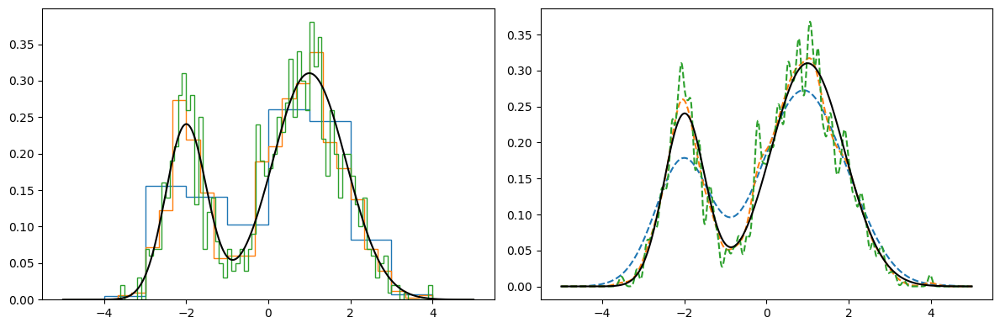

In [29]:
fig,ax=plt.subplots(1,2,figsize=(12,4))

for i in range(len(nBinList)):
    hist=np.histogram(xList[0],bins=nBinList[i],range=rng,density=True)
    ax[0].stairs(*hist,color=colors[i])
    ax[1].plot(x_plot,np.exp(log_dens_list[i]),ls="dashed")    
ax[0].plot(x_plot,real_dens,c="k")
ax[1].plot(x_plot,real_dens,c="k")
plt.tight_layout()
plt.show()

In [33]:
## Bias-variance tradeoff: Number of samples, number of bins, kernel width

In [30]:
# adjust more extreme numbers for samples and bins
nXList=[100,1000,10000]
nBinList=[10,33,100]
# sample points from Gaussian mixture model
xList=[]
for nX in nXList:
    x=np.zeros((0,),dtype=np.double)
    for mean,std,weight in zip(meanList,stdList,weightList):
        x=np.concatenate((x,mean+std*np.random.normal(size=int(nX*weight))))
    xList.append(x)

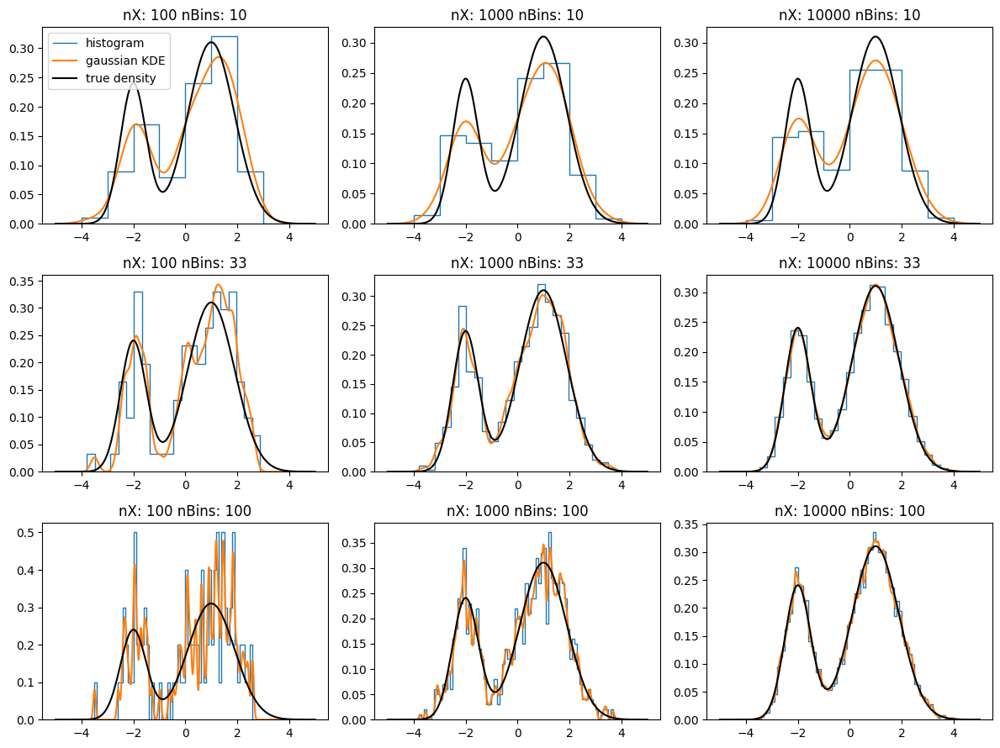

In [31]:
fig,axs=plt.subplots(len(nBinList),len(nXList),figsize=(4*len(nBinList),3*len(nXList)))
for i,xL in enumerate(xList):
    for j,nBinsL in enumerate(nBinList):

        # compute histogram and gaussian kernel density
        kWidthL=(rng[1]-rng[0])/nBinsL/2
        hist_dens,edges=np.histogram(xL,range=rng,bins=nBinsL,density=True)

        kde = KernelDensity(kernel='gaussian', bandwidth=kWidthL).fit(xL.reshape((-1,1)))
        log_dens = kde.score_samples(x_plot.reshape((-1,1)))
        ax=axs[j,i]
        ax.set_title("nX: {:d} nBins: {:d}".format(len(xL),nBinsL))
        ax.stairs(hist_dens,edges,color=colors[0],label="histogram")
        ax.plot(x_plot,np.exp(log_dens),c=colors[1],label="gaussian KDE")
        ax.plot(x_plot,real_dens,c="k",ls="solid",label="true density")
axs[0,0].legend()
plt.tight_layout()
plt.show()
# -

## Multiple histograms

In [32]:
# what is distribution of carat for different cuts?
keepcuts=data_diamonds["cut"].unique()
print(keepcuts)

['Ideal', 'Premium', 'Good', 'Very Good', 'Fair']
Categories (5, object): ['Fair' < 'Good' < 'Very Good' < 'Premium' < 'Ideal']


In [33]:
# if we keep all cuts, the following plot is going to be very cluttered
keepcuts=["Fair","Premium","Ideal"]

data_grouped=data_diamonds[data_diamonds["cut"].isin(keepcuts)].groupby("cut",observed=True)["carat"]

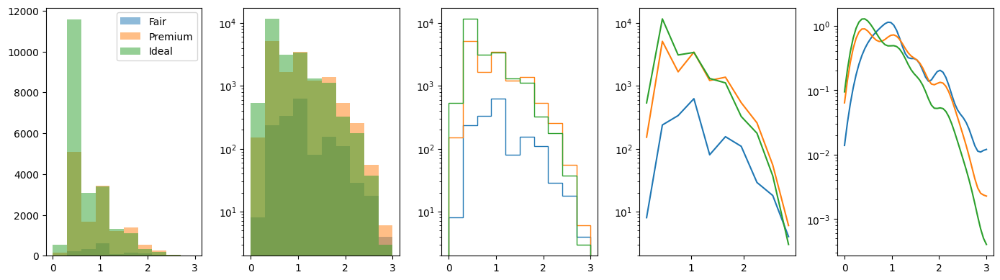

In [34]:
x_plot=np.linspace(0,3,num=50)
fig,ax=plt.subplots(1,5,figsize=(14,4))
for i,(cut,data_sel) in enumerate(data_grouped):
    ax[0].hist(data_sel,label=cut,bins=10,range=[0,3],density=False,alpha=0.5,log=False)
    ax[1].hist(data_sel,label=cut,bins=10,range=[0,3],density=False,alpha=0.5,log=True)
    histdat=np.histogram(data_sel,bins=10,range=[0,3],density=False)
    ax[2].stairs(*histdat)
    ax[2].set_yscale("log")

    xmean=0.5*(histdat[1][:-1]+histdat[1][1:])
    ax[3].plot(xmean,histdat[0])
    ax[3].set_yscale("log")

    kde = KernelDensity(kernel='gaussian', bandwidth=1.5/10).fit(np.array(data_sel).reshape((-1,1)))
    log_dens = kde.score_samples(x_plot.reshape((-1,1)))
    ax[4].plot(x_plot,np.exp(log_dens),label="gaussian KDE")

    #ax[3].stairs(*histdat)
    ax[4].set_yscale("log")
ax[0].legend()
plt.tight_layout()
plt.show()

In [90]:
# some remarks on these plots:
# * the filled area plots with transparency become too cluttered / illegible very quickly
# * log-scale on the y-axis can help to show different histograms at different scales simultaneously,
#   or values in low-density bins
# * several histograms with same bin specs can become difficult to see as step-plots
#   in this case it might be acceptable to show them as sloped lines (which would correspond to a continous interpolation
#   of the estimated density), which reduces the amount of lines lying on top of each other
# * another alternative are kernel density estimates; but computationally a lot more complex and
#   also trickier to use this for non-normalized distributions (could rescale manually)

### An example with altair

In [36]:
data_sel=data_diamonds[data_diamonds["cut"].isin(keepcuts)].copy()
#data_sel["cut"]=data_sel["cut"].astype(str)

In [37]:
alt.Chart(data_sel).mark_bar(
    opacity=1.,
    binSpacing=0,
    filled=False,
    strokeWidth=2
).encode(
    alt.X('carat').bin(step=3/10,extent=[0,3]),
    alt.Y('count()').stack(None).scale(type="log"),
    alt.Color("cut").scale(scheme="category10")
)
# note here also the difficulty of distinguishing the lines when all the vertical steps coincide
# however: different bin specs will also look horribly

alt.Chart(...)

In [38]:
alt.Chart(data_sel).transform_density(
    'carat',as_=["carat","density"],groupby=["cut"],bandwidth=0.15
).mark_line(clip=True).encode(
    alt.X("carat:Q").scale(domain=[0,3]),
    alt.Y('density:Q').scale(type="log",domain=[1e-5,1e1]),
    alt.Color("cut:N").scale(scheme="category10")
)

alt.Chart(...)

## Histograms and densities in two dimensions

In [41]:
# basic principle is the same:
# * histograms count the number of points in bins
# * normalization works in the same way
# * can also apply kernel density estimation
# * similar bias-variance tradeoff (but number of bins now grows quadratically with decreasing binwidth)

### Standard 2d histogram

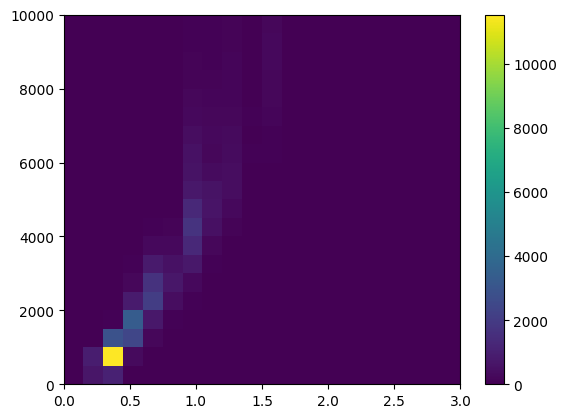

In [42]:
# matplotlib.pyplot.hist2d is a function similar to matplotlib.pyplot.hist
# specifications for bins and range become a bit more complicated
# see documentation for details
# unfortunately log argument does not exist here

# of course there are still explicit numpy functions for 2d and even for general d-dimensional histograms
# but these become increasingly difficult to estimate due to the curse of dimensionality
# and to also to visualize

counts,binlimsx,binlimsy,pltobj=plt.hist2d(data_diamonds["carat"],data_diamonds["price"],\
        bins=20,range=[[0,3],[0,10000]])
plt.colorbar(pltobj)
plt.show()

### Hexbins

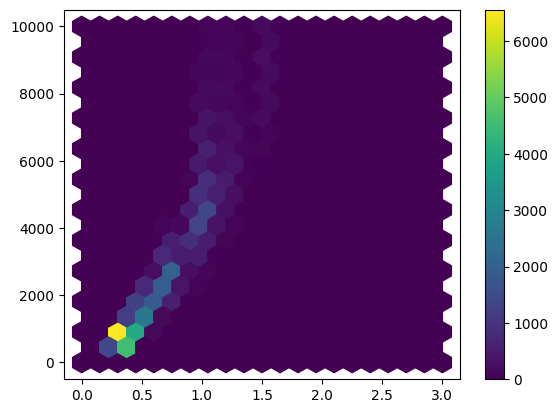

In [132]:
# another cute option
pltobj=plt.hexbin(data_diamonds["carat"],data_diamonds["price"],gridsize=20,extent=[0,3,0,10000])
plt.colorbar(pltobj)
plt.show()

### Kernel density estimation

In [43]:
# unfortunately sklearn KDE does no support anisotropic kernels
# (i.e. different kernel width along different axes)
# so we need to re-scale stuff instead

# prepare and rescale observed data
fitdata=np.stack([data_diamonds["carat"],data_diamonds["price"]]).T
kWidth=np.array([0.2,200])
fitdata/=kWidth

# grid data on which to evaluate KDE
n=50
x=np.linspace(0,3,num=n,endpoint=False)
y=np.linspace(0,10000,num=n,endpoint=False)
X,Y=np.meshgrid(x,y)
pts=np.stack([X.ravel(),Y.ravel()]).T
pts/=kWidth

kde = KernelDensity(kernel='gaussian', bandwidth=1).fit(fitdata)
log_dens = kde.score_samples(pts)

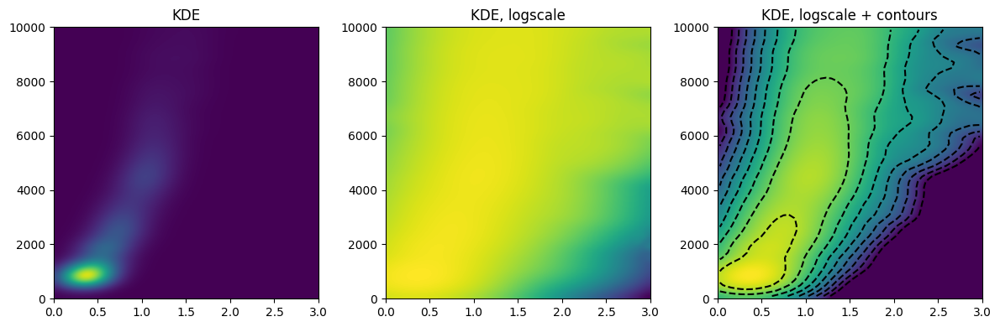

In [44]:
fig,ax=plt.subplots(1,3,figsize=(12,4))
ax[0].imshow(np.exp(log_dens).reshape((n,n)),origin="lower",extent=[0,3,0,10000],aspect="auto",interpolation="bicubic")
ax[0].set_title("KDE")
ax[1].imshow(log_dens.reshape((n,n)),origin="lower",extent=[0,3,0,10000],aspect="auto",interpolation="bicubic")
ax[1].set_title("KDE, logscale")

vmax=np.max(log_dens)
vmin=np.min(log_dens)
vmineff=vmin+0.8*(vmax-vmin)
levels=np.linspace(vmineff,vmax,num=10)

ax[2].imshow(log_dens.reshape((n,n)),origin="lower",extent=[0,3,0,10000],aspect="auto",interpolation="bicubic",vmin=vmineff,vmax=vmax)
ax[2].set_title("KDE, logscale + contours")

ax[2].contour(log_dens.reshape((n,n)),levels=levels,origin="lower",extent=[0,3,0,10000],colors="k")
plt.tight_layout()
plt.show()

### Show 1d marginals on axes

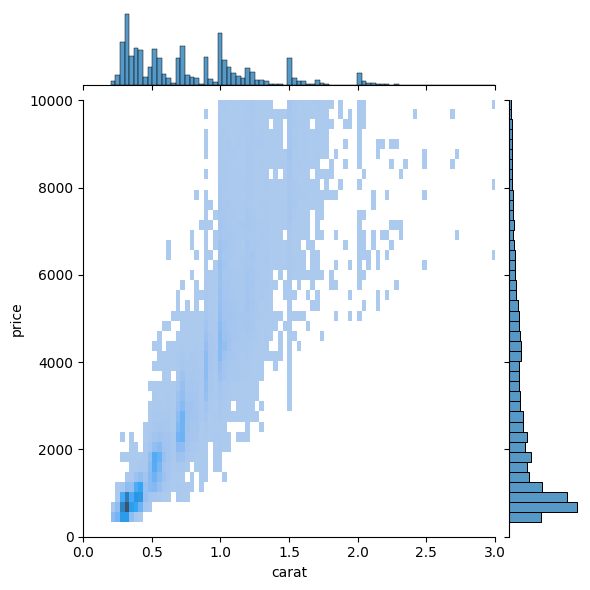

In [75]:
# an example with seaborn:
# show 1d marginals
sns.jointplot(data=data_diamonds,x="carat",y="price", kind='hist',xlim=[0,3],ylim=[0,10000]);

In [ ]:
# see
# https://seaborn.pydata.org/generated/seaborn.jointplot.html
# for more examples of this type
# again we observe: great if you need an example of that specific type
# very difficult to customize beyond the scope of the function

### Encode density as size

In [50]:
alt.Chart(data_diamonds).mark_circle().encode(
    alt.X('carat').bin(step=3/10,extent=[0,3]),
    alt.Y('price').bin(step=10000/10,extent=[0,10000]),
    size='count()'
    )

alt.Chart(...)